In [106]:
import pandas as pd # dataframe manipulation
import numpy as np # linear algebra

# data visualization
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import shap

# sklearn 
from sklearn.cluster import KMeans
from sklearn.preprocessing import PowerTransformer, OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, silhouette_samples, accuracy_score, classification_report

from pyod.models.ecod import ECOD
from yellowbrick.cluster import KElbowVisualizer

import lightgbm as lgb
import prince

In [107]:
def get_pca_2d(df, predict):
    pca_2d_object = prince.PCA(
    n_components=2,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_2d_object.fit(df)

    df_pca_2d = pca_2d_object.transform(df)
    df_pca_2d.columns = ["comp1", "comp2"]
    df_pca_2d["cluster"] = predict

    return pca_2d_object, df_pca_2d



def get_pca_3d(df, predict):
    pca_3d_object = prince.PCA(
        n_components=3,
        n_iter=3,
        rescale_with_mean=True,
        rescale_with_std=True,
        copy=True,
        check_input=True,
        engine='sklearn',
        random_state=42
    )

    pca_3d_object.fit(df)

    df_pca_3d = pca_3d_object.transform(df)
    df_pca_3d.columns = ["comp1", "comp2", "comp3"]
    df_pca_3d["cluster"] = predict

    return pca_3d_object, df_pca_3d



def plot_pca_3d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    fig = px.scatter_3d(df, 
                        x='comp1', 
                        y='comp2', 
                        z='comp3',
                        color='cluster',
                        template="plotly",
                        
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 4,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 1000, 
                                height = 800, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'comp1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'comp2', titlefont_color = 'black'),
                                            zaxis=dict(title = 'comp3', titlefont_color = 'black')),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                      
    
    fig.show()


def plot_pca_2d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    fig = px.scatter(df, 
                        x='comp1', 
                        y='comp2', 
                        color='cluster',
                        template="plotly",
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 8,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 800, 
                                height = 700, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'comp1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'comp2', titlefont_color = 'black'),
                                            ),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                        
        
    fig.show()


In [108]:
embedding_df = pd.read_csv('../datasets/Pakistan_Ecommerce/rfm_embedding.csv')
rfm_df = pd.read_csv('../datasets/Pakistan_Ecommerce/rfm.csv')

In [109]:
embedding_df.iloc[:, 0] = embedding_df.iloc[:, 0].astype(int).astype(str)
embedding_df

,0,1,2,3,4,5,6,7,8,9,...,759,760,761,762,763,764,765,766,767,768
0,1,0.027553,0.075592,-0.004154,0.032484,-0.018314,-0.041990,0.028784,0.015180,-0.008948,...,0.000961,-0.043752,-0.020272,0.007038,-0.007795,0.027966,-0.019098,0.039021,0.000568,0.019237
1,3,0.018404,0.060627,-0.004330,0.024581,-0.035879,-0.048666,-0.019052,0.029558,-0.016038,...,0.022971,-0.025133,-0.010234,0.003425,-0.010827,0.001008,0.012684,0.048591,-0.014719,0.017675
2,4,0.018136,0.050329,-0.004303,0.025111,-0.040579,-0.053548,-0.021425,0.033152,-0.035411,...,0.017286,-0.025220,0.000143,0.012129,-0.008145,0.012198,-0.001923,0.053937,-0.011559,0.017839
3,6,0.027553,0.075592,-0.004154,0.032484,-0.018314,-0.041990,0.028784,0.015180,-0.008948,...,0.000961,-0.043752,-0.020272,0.007038,-0.007795,0.027966,-0.019098,0.039021,0.000568,0.019237
4,7,0.025606,0.062882,-0.004133,0.034055,-0.027723,-0.046881,0.020611,0.019658,-0.014579,...,0.009746,-0.035312,-0.019050,0.008660,-0.008685,0.036232,-0.014210,0.048493,0.001722,0.020490
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62284,115200,0.018136,0.050329,-0.004303,0.025111,-0.040579,-0.053548,-0.021425,0.033152,-0.035411,...,0.017286,-0.025220,0.000143,0.012129,-0.008145,0.012198,-0.001923,0.053937,-0.011559,0.017839
62285,115218,0.018136,0.050329,-0.004303,0.025111,-0.040579,-0.053548,-0.021425,0.033152,-0.035411,...,0.017286,-0.025220,0.000143,0.012129,-0.008145,0.012198,-0.001923,0.053937,-0.011559,0.017839
62286,115267,0.018136,0.050329,-0.004303,0.025111,-0.040579,-0.053548,-0.021425,0.033152,-0.035411,...,0.017286,-0.025220,0.000143,0.012129,-0.008145,0.012198,-0.001923,0.053937,-0.011559,0.017839
62287,115276,0.018136,0.050329,-0.004303,0.025111,-0.040579,-0.053548,-0.021425,0.033152,-0.035411,...,0.017286,-0.025220,0.000143,0.012129,-0.008145,0.012198,-0.001923,0.053937,-0.011559,0.017839


In [110]:
rfm_df

,Customer ID,Recency,RecencyScore,RecencyScoreText,Frequency,FrequencyScore,FrequencyScoreText,MonetaryValue,MonetaryScore,MonetaryScoreText
0,1.0,789,1,a very long time ago,1,1,extremely rarely,1950.0,1,only a very little money
1,3.0,467,3,no so recently,4,1,extremely rarely,1245.0,1,only a very little money
2,4.0,2,5,very recently,261,1,extremely rarely,1445579.0,1,only a very little money
3,6.0,789,1,a very long time ago,1,1,extremely rarely,170.0,1,only a very little money
4,7.0,501,2,some time ago,4,1,extremely rarely,1939.0,1,only a very little money
...,...,...,...,...,...,...,...,...,...,...
62284,115200.0,4,5,very recently,3,1,extremely rarely,9029.0,1,only a very little money
62285,115218.0,3,5,very recently,1,1,extremely rarely,600.0,1,only a very little money
62286,115267.0,2,5,very recently,3,1,extremely rarely,1397.0,1,only a very little money
62287,115276.0,2,5,very recently,2,1,extremely rarely,3749.0,1,only a very little money


In [111]:
rfm_df = rfm_df[['Customer ID', 'RecencyScore', 'FrequencyScore', 'MonetaryScore']]

# convert customer id to int and then to string
rfm_df['Customer ID'] = rfm_df['Customer ID'].astype(int).astype(str)

rfm_df


C:\Users\Shamika Tissera\AppData\Local\Temp\ipykernel_32408\3648105767.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Customer ID,RecencyScore,FrequencyScore,MonetaryScore
0,1,1,1,1
1,3,3,1,1
2,4,5,1,1
3,6,1,1,1
4,7,2,1,1
...,...,...,...,...
62284,115200,5,1,1
62285,115218,5,1,1
62286,115267,5,1,1
62287,115276,5,1,1


Outliers

In [112]:
# from pyod.models.ecod import ECOD
# # https://github.com/yzhao062/pyod

# # Unsupervised Outlier Detection Using Empirical Cumulative Distribution Functions (ECOD)
# clf = ECOD()
# clf.fit(embedding_df.iloc[:, 1:])

# out = clf.predict(embedding_df.iloc[:, 1:])
# embedding_df["outliers"] = out
# # rfm_df["outliers"] = out

# df_embedding_no_out = embedding_df[embedding_df["outliers"] == 0]
# df_embedding_no_out = df_embedding_no_out.drop(["outliers"], axis = 1)

# df_embedding_with_out = embedding_df.copy()
# df_embedding_with_out = df_embedding_with_out.drop(["outliers"], axis = 1)

In [113]:
# df_embedding_no_out.iloc[:, 1:]

In [114]:
# df_embedding_with_out.shape

In [115]:
# # Instantiate the clustering model and visualizer
# km = KMeans(init="k-means++", random_state=0, n_init="auto")
# visualizer = KElbowVisualizer(km, k=(2,10), locate_elbow=True)

# visualizer.fit(df_embedding_with_out.iloc[:, 1:])        # Fit the data to the visualizer
# visualizer.show()

In [116]:
# def make_Silhouette_plot(X, n_clusters):
#     plt.xlim([-0.1, 1])
#     plt.ylim([0, len(X) + (n_clusters + 1) * 10])
#     clusterer = KMeans(n_clusters=n_clusters, max_iter = 1000, n_init = 10, init = 'k-means++', random_state=10)
#     cluster_labels = clusterer.fit_predict(X)
#     silhouette_avg = silhouette_score(X, cluster_labels)
#     print(
#         "For n_clusters =", n_clusters,
#         "The average silhouette_score is :", silhouette_avg,
#     )
# # Compute the silhouette scores for each sample
#     sample_silhouette_values = silhouette_samples(X, cluster_labels)
#     y_lower = 10
#     for i in range(n_clusters):
#         ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
#         ith_cluster_silhouette_values.sort()
#         size_cluster_i = ith_cluster_silhouette_values.shape[0]
#         y_upper = y_lower + size_cluster_i
#         color = cm.nipy_spectral(float(i) / n_clusters)
#         plt.fill_betweenx(
#             np.arange(y_lower, y_upper),
#             0,
#             ith_cluster_silhouette_values,
#             facecolor=color,
#             edgecolor=color,
#             alpha=0.7,
#         )
#         plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
#         y_lower = y_upper + 10
#         plt.title(f"The Silhouette Plot for n_cluster = {n_clusters}", fontsize=26)
#         plt.xlabel("The silhouette coefficient values", fontsize=24)
#         plt.ylabel("Cluster label", fontsize=24)
#         plt.axvline(x=silhouette_avg, color="red", linestyle="--")
#         plt.yticks([])  
#         plt.xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    
# range_n_clusters = list(range(2,10))
# for n_clusters in range_n_clusters:
#     print(f"N cluster: {n_clusters}")
#     make_Silhouette_plot(df_embedding_no_out.iloc[:, 1:], n_clusters)   
#     plt.savefig('Silhouette_plot_{}.png'.format(n_clusters))
#     plt.close()

In [117]:
n_clusters = 4

In [118]:
embedding_df

,0,1,2,3,4,5,6,7,8,9,...,759,760,761,762,763,764,765,766,767,768
0,1,0.027553,0.075592,-0.004154,0.032484,-0.018314,-0.041990,0.028784,0.015180,-0.008948,...,0.000961,-0.043752,-0.020272,0.007038,-0.007795,0.027966,-0.019098,0.039021,0.000568,0.019237
1,3,0.018404,0.060627,-0.004330,0.024581,-0.035879,-0.048666,-0.019052,0.029558,-0.016038,...,0.022971,-0.025133,-0.010234,0.003425,-0.010827,0.001008,0.012684,0.048591,-0.014719,0.017675
2,4,0.018136,0.050329,-0.004303,0.025111,-0.040579,-0.053548,-0.021425,0.033152,-0.035411,...,0.017286,-0.025220,0.000143,0.012129,-0.008145,0.012198,-0.001923,0.053937,-0.011559,0.017839
3,6,0.027553,0.075592,-0.004154,0.032484,-0.018314,-0.041990,0.028784,0.015180,-0.008948,...,0.000961,-0.043752,-0.020272,0.007038,-0.007795,0.027966,-0.019098,0.039021,0.000568,0.019237
4,7,0.025606,0.062882,-0.004133,0.034055,-0.027723,-0.046881,0.020611,0.019658,-0.014579,...,0.009746,-0.035312,-0.019050,0.008660,-0.008685,0.036232,-0.014210,0.048493,0.001722,0.020490
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62284,115200,0.018136,0.050329,-0.004303,0.025111,-0.040579,-0.053548,-0.021425,0.033152,-0.035411,...,0.017286,-0.025220,0.000143,0.012129,-0.008145,0.012198,-0.001923,0.053937,-0.011559,0.017839
62285,115218,0.018136,0.050329,-0.004303,0.025111,-0.040579,-0.053548,-0.021425,0.033152,-0.035411,...,0.017286,-0.025220,0.000143,0.012129,-0.008145,0.012198,-0.001923,0.053937,-0.011559,0.017839
62286,115267,0.018136,0.050329,-0.004303,0.025111,-0.040579,-0.053548,-0.021425,0.033152,-0.035411,...,0.017286,-0.025220,0.000143,0.012129,-0.008145,0.012198,-0.001923,0.053937,-0.011559,0.017839
62287,115276,0.018136,0.050329,-0.004303,0.025111,-0.040579,-0.053548,-0.021425,0.033152,-0.035411,...,0.017286,-0.025220,0.000143,0.012129,-0.008145,0.012198,-0.001923,0.053937,-0.011559,0.017839


In [119]:
clusters = KMeans(n_clusters=n_clusters, init = "k-means++").fit(embedding_df.iloc[:, 1:])
print('Cluster Inertia : ', clusters.inertia_)
clusters_predict = clusters.predict(embedding_df.iloc[:, 1:])

C:\Users\Shamika Tissera\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Cluster Inertia :  13.492207036952601


In [120]:
clusters_predict

array([0, 3, 1, ..., 1, 1, 1])

In [121]:
embedding_df

,0,1,2,3,4,5,6,7,8,9,...,759,760,761,762,763,764,765,766,767,768
0,1,0.027553,0.075592,-0.004154,0.032484,-0.018314,-0.041990,0.028784,0.015180,-0.008948,...,0.000961,-0.043752,-0.020272,0.007038,-0.007795,0.027966,-0.019098,0.039021,0.000568,0.019237
1,3,0.018404,0.060627,-0.004330,0.024581,-0.035879,-0.048666,-0.019052,0.029558,-0.016038,...,0.022971,-0.025133,-0.010234,0.003425,-0.010827,0.001008,0.012684,0.048591,-0.014719,0.017675
2,4,0.018136,0.050329,-0.004303,0.025111,-0.040579,-0.053548,-0.021425,0.033152,-0.035411,...,0.017286,-0.025220,0.000143,0.012129,-0.008145,0.012198,-0.001923,0.053937,-0.011559,0.017839
3,6,0.027553,0.075592,-0.004154,0.032484,-0.018314,-0.041990,0.028784,0.015180,-0.008948,...,0.000961,-0.043752,-0.020272,0.007038,-0.007795,0.027966,-0.019098,0.039021,0.000568,0.019237
4,7,0.025606,0.062882,-0.004133,0.034055,-0.027723,-0.046881,0.020611,0.019658,-0.014579,...,0.009746,-0.035312,-0.019050,0.008660,-0.008685,0.036232,-0.014210,0.048493,0.001722,0.020490
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62284,115200,0.018136,0.050329,-0.004303,0.025111,-0.040579,-0.053548,-0.021425,0.033152,-0.035411,...,0.017286,-0.025220,0.000143,0.012129,-0.008145,0.012198,-0.001923,0.053937,-0.011559,0.017839
62285,115218,0.018136,0.050329,-0.004303,0.025111,-0.040579,-0.053548,-0.021425,0.033152,-0.035411,...,0.017286,-0.025220,0.000143,0.012129,-0.008145,0.012198,-0.001923,0.053937,-0.011559,0.017839
62286,115267,0.018136,0.050329,-0.004303,0.025111,-0.040579,-0.053548,-0.021425,0.033152,-0.035411,...,0.017286,-0.025220,0.000143,0.012129,-0.008145,0.012198,-0.001923,0.053937,-0.011559,0.017839
62287,115276,0.018136,0.050329,-0.004303,0.025111,-0.040579,-0.053548,-0.021425,0.033152,-0.035411,...,0.017286,-0.025220,0.000143,0.012129,-0.008145,0.012198,-0.001923,0.053937,-0.011559,0.017839


In [122]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score

"""
The Davies Bouldin index is defined as the average similarity measure of each cluster with its most similar cluster, where similarity is the ratio of within-cluster distances to between-cluster distances.
The minimum value of the DB Index is 0, whereas a smaller value (closer to 0) represents a better model that produces better clusters.
"""
print(f"Davies bouldin Score: {davies_bouldin_score(embedding_df.iloc[:, 1:],clusters_predict)}")

"""
Calinski Harabaz Index -> Variance Ratio Criterion.
Calinski Harabaz Index is defined as the ratio of the sum of between-cluster dispersion and of within-cluster dispersion.
The higher the index the more separable the clusters.
"""
print(f"Calinski Score: {calinski_harabasz_score(embedding_df.iloc[:, 1:],clusters_predict)}")


"""
The silhouette score is a metric used to calculate the goodness of fit of a clustering algorithm, but can also be used as a method for determining an optimal value of k (see here for more).
Its value ranges from -1 to 1.
A value of 0 indicates clusters are overlapping and either the data or the value of k is incorrect.
1 is the ideal value and indicates that clusters are very dense and nicely separated.
"""
print(f"Silhouette Score: {silhouette_score(embedding_df.iloc[:, 1:],clusters_predict)}")

Davies bouldin Score: 0.044903154178551175
Calinski Score: 4450846.414585338
Silhouette Score: 0.9819378856866846


In [38]:
# df_embedding_no_out

,0,1,2,3,4,5,6,7,8,9,...,759,760,761,762,763,764,765,766,767,768
0,1.0,0.027553,0.075592,-0.004154,0.032484,-0.018314,-0.041990,0.028784,0.015180,-0.008948,...,0.000961,-0.043752,-0.020272,0.007038,-0.007795,0.027966,-0.019098,0.039021,0.000568,0.019237
1,3.0,0.018404,0.060627,-0.004330,0.024581,-0.035879,-0.048666,-0.019052,0.029558,-0.016038,...,0.022971,-0.025133,-0.010234,0.003425,-0.010827,0.001008,0.012684,0.048591,-0.014719,0.017675
3,6.0,0.027553,0.075592,-0.004154,0.032484,-0.018314,-0.041990,0.028784,0.015180,-0.008948,...,0.000961,-0.043752,-0.020272,0.007038,-0.007795,0.027966,-0.019098,0.039021,0.000568,0.019237
4,7.0,0.025606,0.062882,-0.004133,0.034055,-0.027723,-0.046881,0.020611,0.019658,-0.014579,...,0.009746,-0.035312,-0.019050,0.008660,-0.008685,0.036232,-0.014210,0.048493,0.001722,0.020490
5,9.0,0.027553,0.075592,-0.004154,0.032484,-0.018314,-0.041990,0.028784,0.015180,-0.008948,...,0.000961,-0.043752,-0.020272,0.007038,-0.007795,0.027966,-0.019098,0.039021,0.000568,0.019237
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61332,97429.0,0.021403,0.047471,-0.004371,0.027586,-0.046613,-0.051194,-0.021970,0.035251,-0.031686,...,0.013198,-0.020435,-0.000618,0.010765,-0.010733,0.015255,0.000266,0.056063,-0.010441,0.017393
61333,97439.0,0.021403,0.047471,-0.004371,0.027586,-0.046613,-0.051194,-0.021970,0.035251,-0.031686,...,0.013198,-0.020435,-0.000618,0.010765,-0.010733,0.015255,0.000266,0.056063,-0.010441,0.017393
61334,97458.0,0.021403,0.047471,-0.004371,0.027586,-0.046613,-0.051194,-0.021970,0.035251,-0.031686,...,0.013198,-0.020435,-0.000618,0.010765,-0.010733,0.015255,0.000266,0.056063,-0.010441,0.017393
61339,97515.0,0.021403,0.047471,-0.004371,0.027586,-0.046613,-0.051194,-0.021970,0.035251,-0.031686,...,0.013198,-0.020435,-0.000618,0.010765,-0.010733,0.015255,0.000266,0.056063,-0.010441,0.017393


C:\Users\Shamika Tissera\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Shamika Tissera\AppData\Roaming\Python\Python310\site-packages\sklearn\base.py:1151: ConvergenceWarning:

Number of distinct clusters (4) found smaller than n_clusters (5). Possibly due to duplicate points in X.



[1.22768635e-14 1.22768635e-14 1.22768635e-14 ... 1.22768635e-14
 1.22768635e-14 1.22768635e-14]
[1.86850051e-14 1.86850051e-14 1.86850051e-14 ... 1.86850051e-14
 1.86850051e-14 1.86850051e-14]
[1.43710414e-14 1.43710414e-14 1.43710414e-14 ... 1.43710414e-14
 1.43710414e-14 1.43710414e-14]
[6.86019627e-15 6.86019627e-15 6.86019627e-15 ... 6.86019627e-15
 6.86019627e-15 6.86019627e-15]


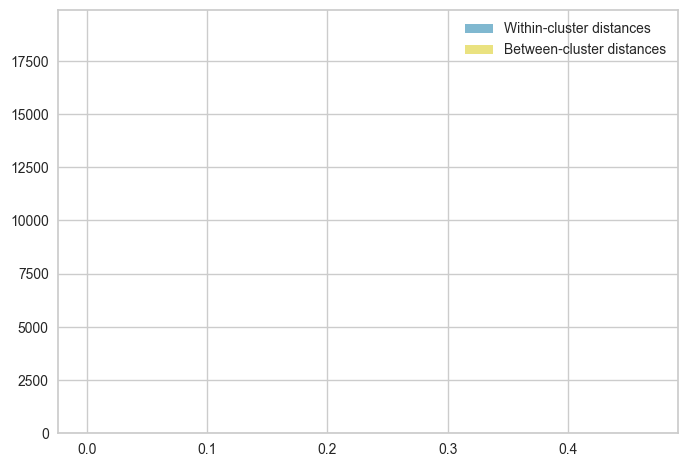

In [39]:
X = df_embedding_no_out.iloc[:, 1:]
kmeans = KMeans(n_clusters=5).fit(X)
labels = kmeans.labels_
centers = kmeans.cluster_centers_

within_cluster_dists = []
between_cluster_dists = []

for i in range(4):
    # Calculate within-cluster distances
    cluster_points = X[labels == i]
    dists = np.linalg.norm(cluster_points - centers[i], axis=1)
    print(dists)
    within_cluster_dists.append(dists)

    # Calculate between-cluster distances for this cluster and all others
    for j in range(i+1, 4):
        dist = np.linalg.norm(centers[i] - centers[j])
        between_cluster_dists.append(dist)

# Visualize the distributions
plt.hist(within_cluster_dists, bins=20, alpha=0.5, label='Within-cluster distances')
plt.hist(between_cluster_dists, bins=20, alpha=0.5, label='Between-cluster distances')
plt.legend(loc='upper right')
plt.show()

In [40]:
df_embedding_no_out

,0,1,2,3,4,5,6,7,8,9,...,759,760,761,762,763,764,765,766,767,768
0,1.0,0.027553,0.075592,-0.004154,0.032484,-0.018314,-0.041990,0.028784,0.015180,-0.008948,...,0.000961,-0.043752,-0.020272,0.007038,-0.007795,0.027966,-0.019098,0.039021,0.000568,0.019237
1,3.0,0.018404,0.060627,-0.004330,0.024581,-0.035879,-0.048666,-0.019052,0.029558,-0.016038,...,0.022971,-0.025133,-0.010234,0.003425,-0.010827,0.001008,0.012684,0.048591,-0.014719,0.017675
3,6.0,0.027553,0.075592,-0.004154,0.032484,-0.018314,-0.041990,0.028784,0.015180,-0.008948,...,0.000961,-0.043752,-0.020272,0.007038,-0.007795,0.027966,-0.019098,0.039021,0.000568,0.019237
4,7.0,0.025606,0.062882,-0.004133,0.034055,-0.027723,-0.046881,0.020611,0.019658,-0.014579,...,0.009746,-0.035312,-0.019050,0.008660,-0.008685,0.036232,-0.014210,0.048493,0.001722,0.020490
5,9.0,0.027553,0.075592,-0.004154,0.032484,-0.018314,-0.041990,0.028784,0.015180,-0.008948,...,0.000961,-0.043752,-0.020272,0.007038,-0.007795,0.027966,-0.019098,0.039021,0.000568,0.019237
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61332,97429.0,0.021403,0.047471,-0.004371,0.027586,-0.046613,-0.051194,-0.021970,0.035251,-0.031686,...,0.013198,-0.020435,-0.000618,0.010765,-0.010733,0.015255,0.000266,0.056063,-0.010441,0.017393
61333,97439.0,0.021403,0.047471,-0.004371,0.027586,-0.046613,-0.051194,-0.021970,0.035251,-0.031686,...,0.013198,-0.020435,-0.000618,0.010765,-0.010733,0.015255,0.000266,0.056063,-0.010441,0.017393
61334,97458.0,0.021403,0.047471,-0.004371,0.027586,-0.046613,-0.051194,-0.021970,0.035251,-0.031686,...,0.013198,-0.020435,-0.000618,0.010765,-0.010733,0.015255,0.000266,0.056063,-0.010441,0.017393
61339,97515.0,0.021403,0.047471,-0.004371,0.027586,-0.046613,-0.051194,-0.021970,0.035251,-0.031686,...,0.013198,-0.020435,-0.000618,0.010765,-0.010733,0.015255,0.000266,0.056063,-0.010441,0.017393


In [41]:
# df_embedding_no_out = df_embedding_no_out.iloc[:, 1:]


In [42]:
print(rfm_df.shape)
print(df_embedding_no_out.shape)

(62289, 11)
(60605, 769)


In [43]:
# compare the two dataframes customer ids and remove the ones that are not in the df_embedding_no_out dataframe
print(rfm_df.shape)
print(df_embedding_no_out.shape)

rfm_df = rfm_df[rfm_df["Customer ID"].isin(df_embedding_no_out['0'])]
print(rfm_df.shape)



(62289, 11)
(60605, 769)
(60605, 11)


In [44]:
rfm_df["cluster"] = clusters_predict
rfm_df

ValueError: Length of values (62289) does not match length of index (60605)

In [ ]:
df_embedding_no_out

,0,1,2,3,4,5,6,7,8,9,...,759,760,761,762,763,764,765,766,767,768
0,1.0,0.027553,0.075592,-0.004154,0.032484,-0.018314,-0.041990,0.028784,0.015180,-0.008948,...,0.000961,-0.043752,-0.020272,0.007038,-0.007795,0.027966,-0.019098,0.039021,0.000568,0.019237
1,3.0,0.018404,0.060627,-0.004330,0.024581,-0.035879,-0.048666,-0.019052,0.029558,-0.016038,...,0.022971,-0.025133,-0.010234,0.003425,-0.010827,0.001008,0.012684,0.048591,-0.014719,0.017675
3,6.0,0.027553,0.075592,-0.004154,0.032484,-0.018314,-0.041990,0.028784,0.015180,-0.008948,...,0.000961,-0.043752,-0.020272,0.007038,-0.007795,0.027966,-0.019098,0.039021,0.000568,0.019237
4,7.0,0.025606,0.062882,-0.004133,0.034055,-0.027723,-0.046881,0.020611,0.019658,-0.014579,...,0.009746,-0.035312,-0.019050,0.008660,-0.008685,0.036232,-0.014210,0.048493,0.001722,0.020490
5,9.0,0.027553,0.075592,-0.004154,0.032484,-0.018314,-0.041990,0.028784,0.015180,-0.008948,...,0.000961,-0.043752,-0.020272,0.007038,-0.007795,0.027966,-0.019098,0.039021,0.000568,0.019237
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61332,97429.0,0.021403,0.047471,-0.004371,0.027586,-0.046613,-0.051194,-0.021970,0.035251,-0.031686,...,0.013198,-0.020435,-0.000618,0.010765,-0.010733,0.015255,0.000266,0.056063,-0.010441,0.017393
61333,97439.0,0.021403,0.047471,-0.004371,0.027586,-0.046613,-0.051194,-0.021970,0.035251,-0.031686,...,0.013198,-0.020435,-0.000618,0.010765,-0.010733,0.015255,0.000266,0.056063,-0.010441,0.017393
61334,97458.0,0.021403,0.047471,-0.004371,0.027586,-0.046613,-0.051194,-0.021970,0.035251,-0.031686,...,0.013198,-0.020435,-0.000618,0.010765,-0.010733,0.015255,0.000266,0.056063,-0.010441,0.017393
61339,97515.0,0.021403,0.047471,-0.004371,0.027586,-0.046613,-0.051194,-0.021970,0.035251,-0.031686,...,0.013198,-0.020435,-0.000618,0.010765,-0.010733,0.015255,0.000266,0.056063,-0.010441,0.017393


In [ ]:
rfm_df.drop(["outliers"], axis = 1, inplace = True)

C:\Users\Shamika Tissera\AppData\Local\Temp\ipykernel_35516\3590736521.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
df_embedding_no_out.iloc[:, 1:]

,1,2,3,4,5,6,7,8,9,10,...,759,760,761,762,763,764,765,766,767,768
0,0.027553,0.075592,-0.004154,0.032484,-0.018314,-0.041990,0.028784,0.015180,-0.008948,-0.015819,...,0.000961,-0.043752,-0.020272,0.007038,-0.007795,0.027966,-0.019098,0.039021,0.000568,0.019237
1,0.018404,0.060627,-0.004330,0.024581,-0.035879,-0.048666,-0.019052,0.029558,-0.016038,-0.000257,...,0.022971,-0.025133,-0.010234,0.003425,-0.010827,0.001008,0.012684,0.048591,-0.014719,0.017675
3,0.027553,0.075592,-0.004154,0.032484,-0.018314,-0.041990,0.028784,0.015180,-0.008948,-0.015819,...,0.000961,-0.043752,-0.020272,0.007038,-0.007795,0.027966,-0.019098,0.039021,0.000568,0.019237
4,0.025606,0.062882,-0.004133,0.034055,-0.027723,-0.046881,0.020611,0.019658,-0.014579,-0.013852,...,0.009746,-0.035312,-0.019050,0.008660,-0.008685,0.036232,-0.014210,0.048493,0.001722,0.020490
5,0.027553,0.075592,-0.004154,0.032484,-0.018314,-0.041990,0.028784,0.015180,-0.008948,-0.015819,...,0.000961,-0.043752,-0.020272,0.007038,-0.007795,0.027966,-0.019098,0.039021,0.000568,0.019237
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61332,0.021403,0.047471,-0.004371,0.027586,-0.046613,-0.051194,-0.021970,0.035251,-0.031686,-0.004873,...,0.013198,-0.020435,-0.000618,0.010765,-0.010733,0.015255,0.000266,0.056063,-0.010441,0.017393
61333,0.021403,0.047471,-0.004371,0.027586,-0.046613,-0.051194,-0.021970,0.035251,-0.031686,-0.004873,...,0.013198,-0.020435,-0.000618,0.010765,-0.010733,0.015255,0.000266,0.056063,-0.010441,0.017393
61334,0.021403,0.047471,-0.004371,0.027586,-0.046613,-0.051194,-0.021970,0.035251,-0.031686,-0.004873,...,0.013198,-0.020435,-0.000618,0.010765,-0.010733,0.015255,0.000266,0.056063,-0.010441,0.017393
61339,0.021403,0.047471,-0.004371,0.027586,-0.046613,-0.051194,-0.021970,0.035251,-0.031686,-0.004873,...,0.013198,-0.020435,-0.000618,0.010765,-0.010733,0.015255,0.000266,0.056063,-0.010441,0.017393


In [ ]:
# plot the clusters in 3d
pca_3d_object, df_pca_3d = get_pca_3d(embedding_df.iloc[:, 1:], clusters_predict)
plot_pca_3d(df_pca_3d, title = "PCA Space with 3 Clusters", opacity=0.8, width_line = 0.1)
print("The variability is :", pca_3d_object.eigenvalues_summary)

In [ ]:
# plot the clusters in 2d
pca_2d_object, df_pca_2d = get_pca_2d(df_embedding_no_out.iloc[:, 1:], clusters_predict)
plot_pca_2d(df_pca_2d, title = "PCA Space with 3 Clusters", opacity=0.8, width_line = 0.1)


In [ ]:
# number of customers in each cluster
print(df_pca_3d["cluster"].value_counts())

# calculate the total number of points
total_points = df_pca_3d.shape[0]
print(f"Total points: {total_points}")

cluster
1    32944
0    14962
2    12699
3     1684
Name: count, dtype: int64

In [45]:
# calculate silhouette score
silhouette_score(df_embedding_no_out.iloc[:, 1:], clusters_predict)

1.0

In [46]:
rfm_df

,Customer ID,Recency,RecencyScore,RecencyScoreText,Frequency,FrequencyScore,FrequencyScoreText,MonetaryValue,MonetaryScore,MonetaryScoreText,cluster
0,1.0,789,1,a very long time ago,1,1,extremely rarely,1950.0,1,only a very little money,2
1,3.0,467,3,no so recently,4,1,extremely rarely,1245.0,1,only a very little money,3
3,6.0,789,1,a very long time ago,1,1,extremely rarely,170.0,1,only a very little money,2
4,7.0,501,2,some time ago,4,1,extremely rarely,1939.0,1,only a very little money,0
5,9.0,789,1,a very long time ago,1,1,extremely rarely,5500.0,1,only a very little money,2
...,...,...,...,...,...,...,...,...,...,...,...
61332,97429.0,159,4,recently,5,1,extremely rarely,21877.0,1,only a very little money,1
61333,97439.0,159,4,recently,1,1,extremely rarely,4733.0,1,only a very little money,1
61334,97458.0,159,4,recently,6,1,extremely rarely,3509.0,1,only a very little money,1
61339,97515.0,159,4,recently,1,1,extremely rarely,15833.0,1,only a very little money,1


In [47]:
# calculate the distance between the cluster centers and put it in a dataframe
from sklearn.metrics.pairwise import euclidean_distances
cluster_centers = clusters.cluster_centers_
cluster_centers = pd.DataFrame(cluster_centers)
cluster_centers.columns = df_embedding_no_out.iloc[:, 1:].columns
cluster_centers

,1,2,3,4,5,6,7,8,9,10,...,759,760,761,762,763,764,765,766,767,768
0,0.025606,0.062882,-0.004133,0.034055,-0.027723,-0.046881,0.020611,0.019658,-0.014579,-0.013852,...,0.009746,-0.035312,-0.019050,0.008660,-0.008685,0.036232,-0.014210,0.048493,0.001722,0.020490
1,0.021403,0.047471,-0.004371,0.027586,-0.046613,-0.051194,-0.021970,0.035251,-0.031686,-0.004873,...,0.013198,-0.020435,-0.000618,0.010765,-0.010733,0.015255,0.000266,0.056063,-0.010441,0.017393
2,0.027553,0.075592,-0.004154,0.032484,-0.018314,-0.041990,0.028784,0.015180,-0.008948,-0.015819,...,0.000961,-0.043752,-0.020272,0.007038,-0.007795,0.027966,-0.019098,0.039021,0.000568,0.019237
3,0.018404,0.060627,-0.004330,0.024581,-0.035879,-0.048666,-0.019052,0.029558,-0.016038,-0.000257,...,0.022971,-0.025133,-0.010234,0.003425,-0.010827,0.001008,0.012684,0.048591,-0.014719,0.017675


In [48]:
rfm_df.describe()

,Customer ID,Recency,RecencyScore,Frequency,FrequencyScore,MonetaryValue,MonetaryScore,cluster
count,60605.000000,60605.000000,60605.000000,60605.000000,60605.0,6.060500e+04,60605.0,60605.000000
mean,41524.839238,460.573121,2.609471,3.507516,1.0,1.281525e+04,1.0,1.498985
std,24929.322825,161.445964,1.165040,8.174512,0.0,4.422727e+04,0.0,1.063361
min,1.000000,159.000000,1.000000,1.000000,1.0,0.000000e+00,1.0,0.000000
25%,19918.000000,285.000000,2.000000,1.000000,1.0,9.350000e+02,1.0,1.000000
50%,40029.000000,459.000000,3.000000,2.000000,1.0,2.135000e+03,1.0,1.000000
75%,62905.000000,629.000000,4.000000,3.000000,1.0,9.093000e+03,1.0,2.000000
max,97552.000000,789.000000,4.000000,365.000000,1.0,2.442560e+06,1.0,3.000000


In [49]:
# analyze the clusters' characteristics
copy = rfm_df.groupby("cluster").agg(
    {
        "RecencyScore": "mean", 
        "FrequencyScore": "mean", 
        "MonetaryScore": "mean", 
        "Country": "count"
    }
).reset_index()

# add total rfm score
copy["TotalRFM"] = copy["RecencyScore"] + copy["FrequencyScore"] + copy["MonetaryScore"]
copy

KeyError: "Column(s) ['Country'] do not exist"

In [ ]:
# plot the cluster characteristics
fig = go.Figure()
fig.add_trace(go.Bar(
    x=copy["cluster"],
    y=copy["RecencyScore"],
    name='RecencyScore',
    marker_color='indianred'
))
fig.add_trace(go.Bar(
    x=copy["cluster"],
    y=copy["FrequencyScore"],
    name='FrequencyScore',
    marker_color='lightsalmon'
))
fig.add_trace(go.Bar(
    x=copy["cluster"],
    y=copy["MonetaryScore"],
    name='MonetaryScore',
    marker_color='lightblue'
))


fig.update_layout(
    title='Cluster Characteristics',
    xaxis_tickfont_size=14,
    yaxis=dict(
        title='Value',
        titlefont_size=16,
        tickfont_size=14,
    ),
    legend=dict(
        x=0.85,
        y=0.95,
        bgcolor='rgba(255, 255, 255, 0)',
        bordercolor='rgba(255, 255, 255, 0)'
    ),
    barmode='group',
    bargap=0.15, 
    bargroupgap=0.1 
)
fig.show()

In [ ]:
# import plotly.express as px

# # plot the clusters for rfm_df
# fig = px.scatter_3d(rfm_df,
#                     x = "Recency",
#                     y = "Frequency",
#                     z = "MonetaryValue",
#                     template="plotly",
#                     color_discrete_sequence=px.colors.qualitative.Vivid,
#                     title = "Clusters for RFM",
#                     opacity=0.8,
#                     width = 1000, 
#                     height = 800, 
#                     )
# fig.update_layout(showlegend=True,
#                   scene = dict(xaxis=dict(title = 'Recency', titlefont_color = 'black'),
#                                yaxis=dict(title = 'Frequency', titlefont_color = 'black'),
#                                zaxis=dict(title = 'MonetaryValue', titlefont_color = 'black')),
#                   font = dict(family = "Gilroy", color  = 'black', size = 15),
#                   autosize = False, 
#                   legend=dict(title_font_family="Times New Roman",
#                               font=dict(size= 20)))
# fig.show()


In [ ]:
# # calculate the silhouette score for the rfm_df
# silhouette_score(rfm_df.iloc[:, 1:-1], clusters_predict)

In [ ]:
# pca_3d_object, df_pca_3d = get_pca_3d(rfm_df.iloc[:, 1:], clusters_predict)
# plot_pca_3d(df_pca_3d, title = "PCA Space", opacity=1, width_line = 0.1)
# # %pip install nbformat
# print("The variability is :", pca_3d_object.eigenvalues_summary)

In [ ]:
# plot the clusters in 3d
df_pca_3d

,comp1,comp2,comp3,cluster
0,-0.102080,-2.166357,5.528361,1
1,17.885884,-10.803147,-4.939401,2
2,0.815046,-2.326300,1.475264,1
4,0.533259,-6.496562,5.141756,1
6,-1.375335,-3.684102,0.414981,1
...,...,...,...,...
40278,-3.097301,-2.179258,1.818654,1
40279,-3.844586,0.198363,0.059804,1
40280,-4.410276,-0.936438,5.746968,1
40281,-4.055147,-0.724684,1.914909,1


In [ ]:
rfm_df.iloc[:, 1:]

,CustomerID.1,Recency,Frequency,MonetaryValue,Country,RecencyScore,FrequencyScore,MonetaryScore,RecencyScoreText,FrequencyScoreText,MonetaryScoreText,cluster
0,12346.0,326,2,0.00,United Kingdom,1.0,1.0,1.0,Not recently at all,Not frequently at all,Very low,4
329,12747.0,2,103,4196.01,United Kingdom,5.0,4.0,5.0,Very recently,Frequently,Very high,3
330,12748.0,1,4642,29072.10,United Kingdom,5.0,5.0,5.0,Very recently,Very frequently,Very high,3
331,12749.0,4,231,3868.20,United Kingdom,5.0,5.0,5.0,Very recently,Very frequently,Very high,3
376,12820.0,3,59,942.34,United Kingdom,5.0,4.0,4.0,Very recently,Frequently,High,3
...,...,...,...,...,...,...,...,...,...,...,...,...
4367,18280.0,278,10,180.60,United Kingdom,1.0,1.0,1.0,Not recently at all,Not frequently at all,Very low,4
4368,18281.0,181,7,80.82,United Kingdom,1.0,1.0,1.0,Not recently at all,Not frequently at all,Very low,4
4369,18282.0,8,13,176.60,United Kingdom,5.0,1.0,1.0,Very recently,Not frequently at all,Very low,1
4370,18283.0,4,756,2094.88,United Kingdom,5.0,5.0,5.0,Very recently,Very frequently,Very high,3


In [ ]:
pca_2d_object, df_pca_2d = get_pca_2d(rfm_df.iloc[:, 1:], clusters_predict)
plot_pca_2d(df_pca_2d, title = "PCA Space", opacity=1, width_line = 0.2)


ValueError: could not convert string to float: 'Everything as expected'

In [ ]:
sampling_data = df_embedding_no_out.sample(frac=0.5, replace=True, random_state=1)
sampling_clusters = pd.DataFrame(clusters_predict).sample(frac=0.5, replace=True, random_state=1)[0].values

df_tsne_3d = TSNE(
                  n_components=3, 
                  learning_rate=500, 
                  init='random', 
                  perplexity=200, 
                  n_iter = 5000).fit_transform(sampling_data.iloc[:, 1:])

df_tsne_3d = pd.DataFrame(df_tsne_3d, columns=["comp1", "comp2",'comp3'])
df_tsne_3d["cluster"] = sampling_clusters
plot_pca_3d(df_tsne_3d, title = "T-SNE Space", opacity=1, width_line = 0.1)

In [ ]:
plot_pca_3d(df_tsne_3d, title = "T-SNE Space", opacity=0.1, width_line = 0.1)

In [ ]:
df_tsne_2d = TSNE(
                  n_components=2, 
                  learning_rate=500, 
                  init='random', 
                  perplexity=200, 
                  n_iter = 5000).fit_transform(sampling_data)

df_tsne_2d = pd.DataFrame(df_tsne_2d, columns=["comp1", "comp2"])
df_tsne_2d["cluster"] = sampling_clusters

plot_pca_2d(df_tsne_2d, title = "PCA Space", opacity=0.5, width_line = 0.5)


ValueError: could not convert string to float: 'df913529b303b9222440b3ea06e2cd1e'

In [ ]:
plot_pca_2d(df_tsne_2d, title = "PCA Space", opacity=1, width_line = 0.5)


In [ ]:
df_no_outliers = rfm_df[rfm_df["outliers"] == 0]
df_no_outliers = df_no_outliers.drop("outliers", axis = 1)

In [ ]:
import pandas as pd
import lightgbm as lgb
import shap

clf_km = lgb.LGBMClassifier(colsample_by_tree=0.8)

for col in ["Recency", "Frequency", "MonetaryValue"]:
    df_no_outliers[col] = df_no_outliers[col].astype('category')

clf_km.fit(X = df_no_outliers.iloc[:, 1:] , y = clusters_predict)

#SHAP values
explainer_km = shap.TreeExplainer(clf_km)
shap_values_km = explainer_km.shap_values(df_no_outliers)
shap.summary_plot(shap_values_km, df_no_outliers, plot_type="bar", plot_size=(15, 10))

[LightGBM] [Warning] Unknown parameter: colsample_by_tree
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Unknown parameter: colsample_by_tree
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002118 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 9662
[LightGBM] [Info] Number of data points in the train set: 88798, number of used features: 3
[LightGBM] [Info] Start training from score -0.137894
[LightGBM] [Info] Start training from score -2.566798
[LightGBM] [Info] Start training from score -2.955969


ValueError: pandas dtypes must be int, float or bool.
Fields with bad pandas dtypes: customer_id: object

In [ ]:
y_pred = clf_km.predict(df_no_outliers)
accuracy=accuracy_score(y_pred, clusters_predict)
print('Training-set accuracy score: {0:0.4f}'. format(accuracy))
print(classification_report(clusters_predict, y_pred))

In [ ]:
df_no_outliers["cluster"] = clusters_predict

df_group = df_no_outliers.groupby('cluster').agg(
    {
        'Recency': lambda x: x.value_counts().index[0],
        'Frequency': lambda x: x.value_counts().index[0],
        'Monetary Value': lambda x: x.value_counts().index[0]        
    }
).       sort_values("").reset_index()
df_group